In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 56287, done.
remote: Counting objects: 100% (327/327), done.
remote: Compressing objects: 100% (224/224), done.
remote: Total 56287 (delta 167), reused 240 (delta 102), pack-reused 55960
Receiving objects: 100% (56287/56287), 572.28 MiB | 26.46 MiB/s, done.
Resolving deltas: 100% (38775/38775), done.


In [ ]:
%cd /content/models/research/
!protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
     |████████████████████████████████| 9.0MB 7.2MB/s 
     |████████████████████████████████| 358kB 43.4MB/s 
     |████████████████████████████████| 1.1MB 34.1MB/s 
     |████████████████████████████████| 829kB 38.9MB/s 
     |████████████████████████████████| 61kB 6.7MB/s 
     |████████████████████████████████| 17.7MB 188kB/s 
     |████████████████████████████████| 153kB 36.1MB/s 
     |████████████████████████████████| 61kB 7.7MB/s 
     |████████████████████████████████| 2.3MB 36.2MB/s 
     |████████████████████████████████| 706kB 28.7MB/s 
     |████████████████████████████████| 645kB 39.7MB/s 
     |████████████████████████████████| 174kB 41.5MB/s 
     |████████████████████████████████| 37.6MB 81kB/s 
     |████████████████████████████████| 51kB 5.6MB/s 
     |████████████████████████████████| 102kB 9.8MB/s 
     |████████████████████████████████| 1.2MB 38.2MB/s 
     |████████████████████████████████| 112kB 41.2MB

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2021-04-22 14:11:25.241826: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Running tests under Python 3.7.10: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2021-04-22 14:11:28.241314: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-04-22 14:11:28.242512: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-04-22 14:11:28.313378: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-04-22 14:11:28.314200: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB d

In [ ]:
%cd /content/

/content


In [ ]:
!wget https://raw.githubusercontent.com/hugozanini/object-detection/master/generate_tf_record.py

--2021-04-22 14:12:52--  https://raw.githubusercontent.com/hugozanini/object-detection/master/generate_tf_record.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5076 (5.0K) [text/plain]
Saving to: ‘generate_tf_record.py.1’

generate_tf_record. 100%[===================>]   4.96K  --.-KB/s    in 0s      

2021-04-22 14:12:52 (55.7 MB/s) - ‘generate_tf_record.py.1’ saved [5076/5076]



In [ ]:
!python generate_tf_record.py -l labelmap.txt -o dataset/train.record -i dataset/images -csv dataset/train_labels.csv
!python generate_tf_record.py -l labelmap.txt -o dataset/test.record -i dataset/images -csv dataset/test_labels.csv

2021-04-22 14:14:42.239117: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
INFO:Successfully created the TFRecords: dataset/train.record
2021-04-22 14:14:44.873213: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
INFO:Successfully created the TFRecords: dataset/test.record


In [ ]:
%cd /content
!wget http://download.tensorflow.org/models/object_detection/classification/tf2/20200710/mobilenet_v2.tar.gz
!tar -xvf mobilenet_v2.tar.gz
!rm mobilenet_v2.tar.gz

/content
--2021-04-22 14:14:55--  http://download.tensorflow.org/models/object_detection/classification/tf2/20200710/mobilenet_v2.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.23.128, 2404:6800:4008:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.23.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8404070 (8.0M) [application/x-tar]
Saving to: ‘mobilenet_v2.tar.gz’

mobilenet_v2.tar.gz 100%[===================>]   8.01M  --.-KB/s    in 0.08s   

2021-04-22 14:14:55 (102 MB/s) - ‘mobilenet_v2.tar.gz’ saved [8404070/8404070]

mobilenet_v2/
mobilenet_v2/mobilenet_v2.ckpt-1.index
mobilenet_v2/checkpoint
mobilenet_v2/mobilenet_v2.ckpt-1.data-00001-of-00002
mobilenet_v2/mobilenet_v2.ckpt-1.data-00000-of-00002


In [ ]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
!mv ssd_mobilenet_v2_320x320_coco17_tpu-8.config mobilenet_v2.config

--2021-04-22 14:15:04--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4484 (4.4K) [text/plain]
Saving to: ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.config’

ssd_mobilenet_v2_32 100%[===================>]   4.38K  --.-KB/s    in 0s      

2021-04-22 14:15:04 (53.8 MB/s) - ‘ssd_mobilenet_v2_320x320_coco17_tpu-8.config’ saved [4484/4484]



In [ ]:
num_classes = 1
batch_size = 96 #16
num_steps = 7500 #1500
num_eval_steps = 1000

train_record_path = '/content/dataset/train.record'
test_record_path = '/content/dataset/test.record'
model_dir = '/content/training/'
labelmap_path = '/content/labelmap.pbtxt'

pipeline_config_path = 'mobilenet_v2.config'
fine_tune_checkpoint = '/content/mobilenet_v2/mobilenet_v2.ckpt-1'

In [ ]:
import re

with open(pipeline_config_path) as f:
    config = f.read()

with open(pipeline_config_path, 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(num_classes), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  f.write(config)

In [ ]:
output_directory = 'inference_graph/'

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/{output_directory}/saved_model')

In [ ]:
import pandas as pd
test = pd.read_csv('dataset/test_labels.csv')
images = list(test['filename'][0:20])

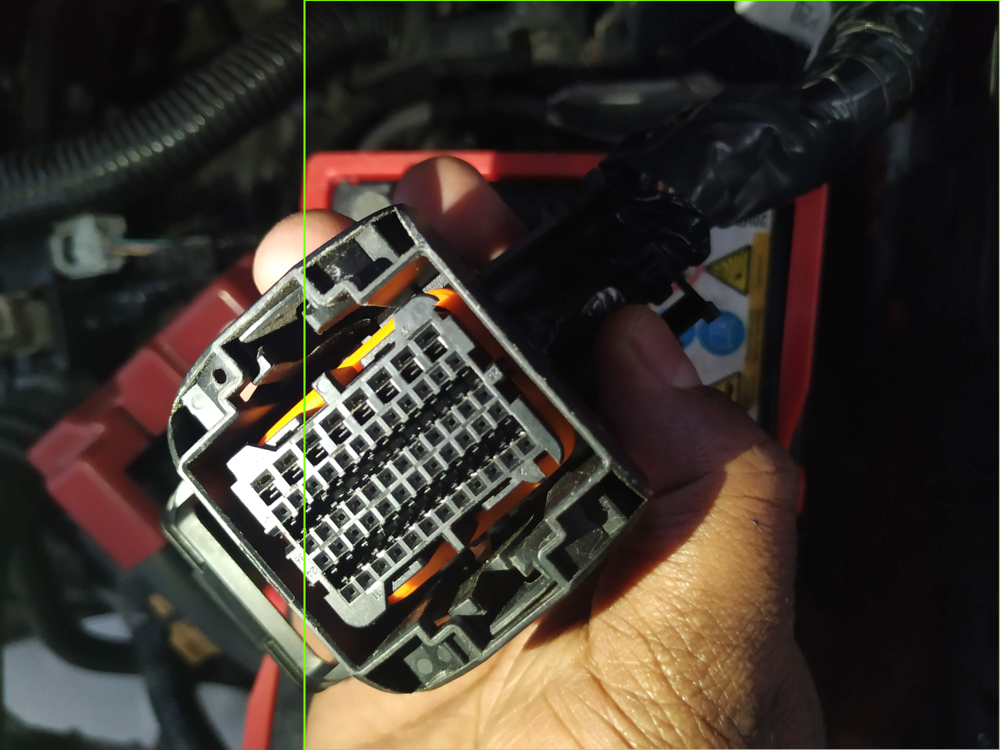

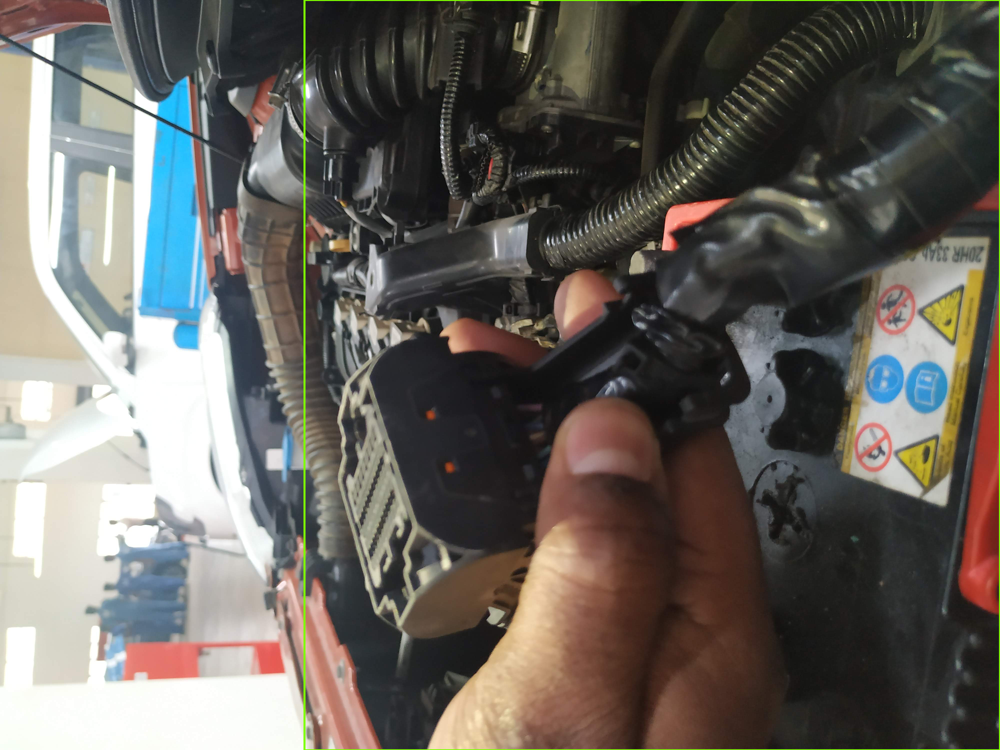

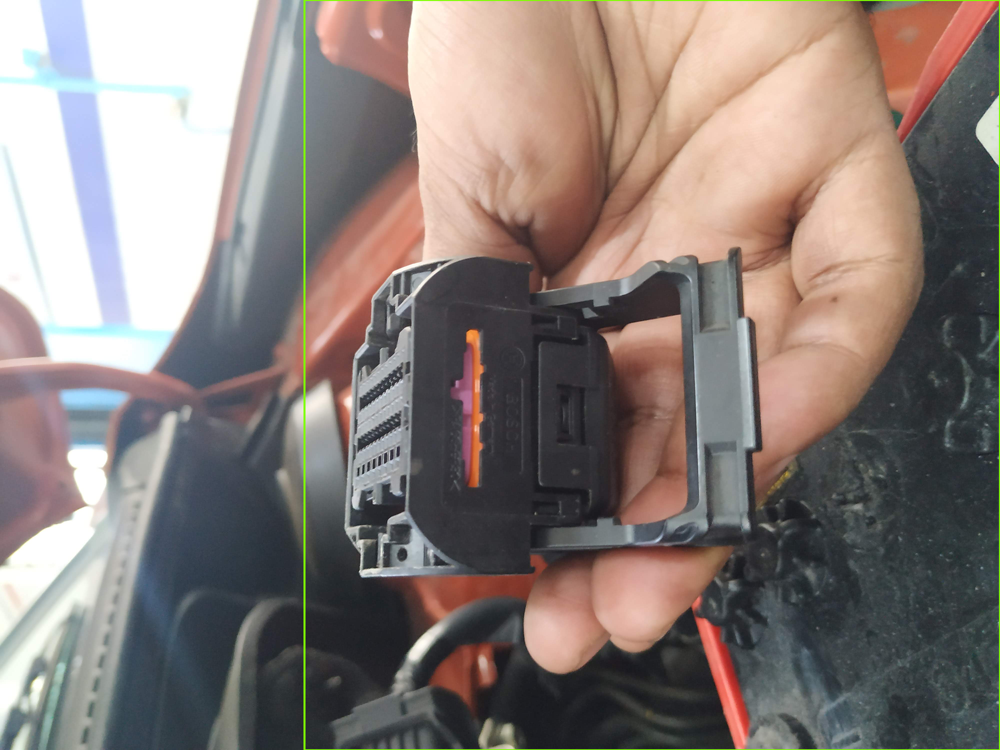

In [ ]:
images = ['IMG_20200226_173209.jpg', 'IMG_20200226_173216.jpg', 'IMG_20200226_173226.jpg']

for image_name in images:
  
  image_np = load_image_into_numpy_array('dataset/' + image_name)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))